In [191]:
# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

# import autograd functionality
from autograd import grad as compute_grad   # The only autograd function you may ever need
import autograd.numpy as np
from autograd import hessian as compute_hess

In [114]:
## Generate Data for an arbitrary three rotational joint system in 2D
l1 = 2
l2 = 2
l3 = 2
l = np.array([l1, l2, l3])

def x_e(q, l=l) :
    sumX = 0
    for ii in range(l.size):
        sumX += l[ii] * np.cos(np.sum(q[:ii, :], axis=0))
    return sumX

def y_e(q, l=l) :
    sumY = 0
    for ii in range(l.size):
        sumY += l[ii] * np.sin(np.sum(q[:ii, :], axis=0))
    return sumY

def theta_e(q):
    return np.sum(q, axis=0)

# Create some training end points by solving the forward kinematics equation
numPoints = 30
# Specifications from paper
q1 = np.linspace(0, np.pi, num=numPoints)
q2 = np.linspace(-np.pi, 0, num=numPoints)
q3 = np.linspace(-np.pi/2, np.pi/2, num=numPoints)
q1v, q2v, q3v = np.meshgrid(q1, q2, q3)
q = np.vstack((q1v.flatten(), q2v.flatten(), q3v.flatten()))

x = x_e(q)
y = y_e(q)
theta = theta_e(q)

In [115]:
# a feature_transforms function for computing
# U_L L layer perceptron units efficiently
def feature_transforms(a, w, activation):    
    # loop through each layer matrix
    for W in w:
        # compute inner product with current layer weights
        a = W[0] + np.dot(a.T, W[1:])

        # output of layer activation
        a = activation(a).T
    return a

# an implementation of our model employing a nonlinear feature transformation
def model(x,w, activation):    
    # feature transformation 
    f = feature_transforms(x,w[0], activation)
    
    # compute linear combination and return
    a = w[1][0] + np.dot(f.T,w[1][1:])
    return a.T

# create initial weights for arbitrary feedforward network
def initialize_network_weights(layer_sizes, scale):
    # container for entire weight tensor
    weights = []
    
    # loop over desired layer sizes and create appropriately sized initial 
    # weight matrix for each layer
    for k in range(len(layer_sizes)-1):
        # get layer sizes for current weight matrix
        U_k = layer_sizes[k]
        U_k_plus_1 = layer_sizes[k+1]

        # make weight matrix
        weight = scale*np.random.randn(U_k+1,U_k_plus_1)
        weights.append(weight)

    # re-express weights so that w_init[0] = omega_inner contains all 
    # internal weight matrices, and w_init = w contains weights of 
    # final linear combination in predict function
    w_init = [weights[:-1],weights[-1]]
    
    return w_init

In [116]:
# Build Neural Network
layerSizes = [3, 100, 50, 3]
w = initialize_network_weights(layerSizes, scale=1)
xData = np.vstack(((x-np.mean(x))/np.std(x),
                   (y-np.mean(y))/np.std(y),
                   theta/np.pi))
yData = q / np.pi

def makeTrainSplit(trainFrac, xi):
     r = np.random.permutation(xi.shape[1])
     train_num = int(np.round(trainFrac*len(r)))
     train_inds = r[:train_num]
     valid_inds = r[train_num:]

     return train_inds, valid_inds
trainIdx, validIdx = makeTrainSplit(.75, xData)

# Wrapper function for the neural network
def nn(w, x):
    return model(x, w, np.tanh)
# In literature, it seems MSE is used, also including L2 normalization term
def nnCost(w, x, y, epsilon=1e-3):
    pred = nn(w, x)
    # Need elementwise multiplication
    presum = (y - pred)**2

    # Get the sum of weights
    sumW = 0
    for superlayer in w:
        for layer in superlayer:
            sumW += np.sum(layer) 

    return np.sum(presum) / (y.shape[1]) + epsilon * sumW / y.shape[1]
grad = compute_grad(nnCost)
hess = compute_hess(nnCost)

# Begin Gradient Descent
numIter = 500
#alpha = .001
c = np.zeros(numIter)

# Make minibatch training
numBatches = 50
miniBatchIdxs = trainIdx
miniBatchIdxs.shape = (numBatches, int(trainIdx.size / numBatches))

from tqdm import tqdm
for ii in tqdm(range(numIter)):
    alpha = .01/(1 + .01 * ii)
    c[ii] = nnCost(w, xData[:, validIdx], yData[:, validIdx], epsilon=0)
    
    # Do mini batches, otherwise training set is too large
    for jj in range(numBatches):
        delta = grad(w, xData[:, miniBatchIdxs[jj, :]], yData[:, miniBatchIdxs[jj, :]])

        # Since output is a list, we have to update things elementwise
        for superlayerIdx in range(len(w)):
            for layerIdx in range(len(w[superlayerIdx])):
                w[superlayerIdx][layerIdx] -= alpha * delta[superlayerIdx][layerIdx]


100%|██████████| 500/500 [05:08<00:00,  1.62it/s]


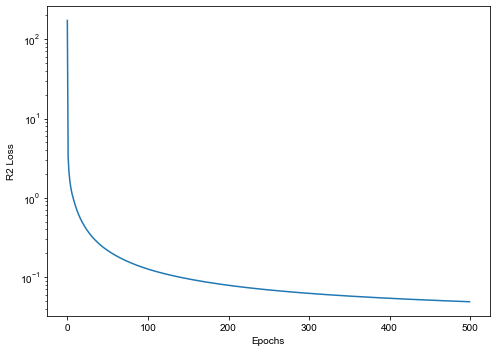

In [117]:
params = {
   'axes.labelsize': 10,
   'font.size': 10,
   'legend.fontsize': 10,
   'font.family': 'Arial',
   'xtick.labelsize': 10,
   'ytick.labelsize': 10,
   'figure.figsize': [7, 5]
   }
rcParams.update(params)

plt.plot(c)
plt.gca().set_yscale('log')
plt.gca().set_xlabel('Epochs')
plt.gca().set_ylabel('R2 Loss')
plt.show()

In [118]:
from matplotlib import cm

params = {
   'axes.labelsize': 10,
   'font.size': 10,
   'legend.fontsize': 10,
   'font.family': 'Arial',
   'xtick.labelsize': 10,
   'ytick.labelsize': 10,
   'figure.figsize': [7, 15]
   }
rcParams.update(params)

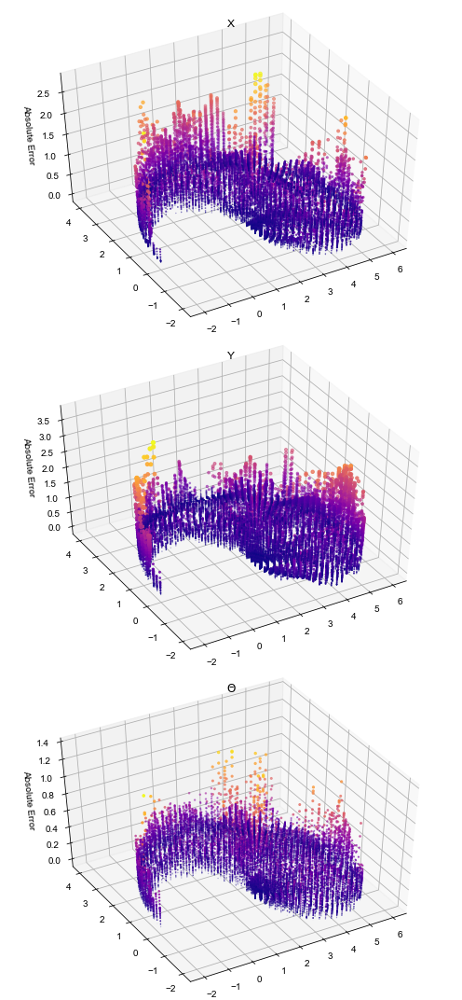

In [119]:
# Calculate Z which is R2 error from expected
pred = nn(w, xData) * np.pi
# Check how close the proposed solution is to the original input xData
xPred = x_e(pred)
yPred = y_e(pred)
thetaPred = theta_e(pred)

inputPredNorm = np.vstack(((xPred-np.mean(x))/np.std(x),
                        (yPred-np.mean(y))/np.std(y),
                        thetaPred/np.pi))

presum = np.abs(inputPredNorm - xData)

origin = 'lower'
# Plot meshgrid on countour plot
colormap = plt.get_cmap('plasma')
fig = plt.figure()
for ii in range(3):
    ax = fig.add_subplot(3, 1, ii+1, projection='3d')
    ax.view_init(elev=45,azim=-120)
    maxPresum = np.amax(presum[ii,:])
    cs = ax.scatter(x, y, presum[ii, :],
                    s=presum[ii,:]*5,
                    c=colormap(presum[ii,:]/maxPresum))
    if ii == 0:
        ax.set_title('X')
    if ii == 1:
        ax.set_title('Y')
    if ii == 2:
        ax.set_title(r'$\Theta$')
    ax.set_zlabel('Absolute Error')

#plt.tight_layout()
plt.show()

In [222]:
#visualize manipulator
#fig = plt.figure()
#ax = plt.axes(projection='3d')
#nn(w, np.array([0,1,1])) * np.pi
import matplotlib.animation
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
theta = np.array([0,0,0])
link1 = np.array([[0,0,0],[0, l1*np.cos(theta[0]), l1*np.sin(theta[0])]])
link2 = np.array([link1[1],[0, link1[1,1] + l2*np.cos(theta[0]+theta[1]), link1[1,2]+l2*np.sin(theta[0]+theta[1])]])
link3 = np.array([link2[1],[0, link2[1,1] + l3*np.cos(theta[0]+theta[1]+theta[2]), link2[1,2]+l3*np.sin(theta[0]+theta[1]+theta[2])]])
fig = plt.figure()
ax = plt.axes(projection='3d')
line1 = ax.plot([link1[0,0], link1[1,0]], [link1[0,1], link1[1,1]], zs = [link1[0,2], link1[1,2]])[0]
line2 = ax.plot([link2[0,0], link2[1,0]], [link2[0,1], link2[1,1]], zs = [link2[0,2], link2[1,2]])[0]
line3 = ax.plot([link3[0,0], link3[1,0]], [link3[0,1], link3[1,1]], zs = [link3[0,2], link3[1,2]])[0]
z_desired = np.linspace(1,3,100)

def animate(i):
    ax.cla()
    theta = nn(w, np.array([0,1.5,z_desired[i]])) * np.pi
    link1 = np.array([[0,0,0],[0, l1*np.cos(theta[0]), l1*np.sin(theta[0])]])
    link2 = np.array([link1[1],[0, link1[1,1] + l2*np.cos(theta[0]+theta[1]), link1[1,2]+l2*np.sin(theta[0]+theta[1])]])
    link3 = np.array([link2[1],[0, link2[1,1] + l3*np.cos(theta[0]+theta[1]+theta[2]), link2[1,2]+l3*np.sin(theta[0]+theta[1]+theta[2])]])
    line1 = ax.plot([link1[0,0], link1[1,0]], [link1[0,1], link1[1,1]], zs = [link1[0,2], link1[1,2]], color = "red")[0]
    line2 = ax.plot([link2[0,0], link2[1,0]], [link2[0,1], link2[1,1]], zs = [link2[0,2], link2[1,2]],color = "yellow")[0]
    line3 = ax.plot([link3[0,0], link3[1,0]], [link3[0,1], link3[1,1]], zs = [link3[0,2], link3[1,2]], color = "blue")[0]
    
matplotlib.animation.FuncAnimation(fig, animate, frames=100)